# Shubert Algorithm for Minimisation

Assume that the objective function $ f(\cdot) $ satisfies the Lipschitz condition with a positive constant $ L $:

$$
|f(x_1) - f(x_2)| \leq L\,|x_1 - x_2|,\quad \forall x_1,x_2 \in [a,b].
$$

The constant $ L $ is known, while the function $ f(\cdot) $ is unknown.

Since $ f(\cdot) $ is Lipschitz continuous, it attains a minimum on the compact interval $[a,b]$. Let

$$
f^* := \min_{x\in[a,b]} f(x)
$$

and define the set of minimisers as

$$
\Phi := \{ x\in[a,b] : f(x) = f^* \}.
$$

The Shubert algorithm [(Shubert, 1972)](https://www.scirp.org/reference/referencespapers?referenceid=212981) generates a sequence of points $ x_1, x_2, \dots $ in $[a,b]$ as follows:

1. **Initialisation:** Choose an initial point $ x_1 \in [a,b] $ arbitrarily.

2. **Iteration:** For $ k = 1,2,\dots $, define the function

   $$
   F_k(x) := \max_{j=1,\dots,k} \{ f(x_j) - L\,|x - x_j| \}.
   $$

   This function provides a lower bound on $ f(x) $ based on the previous evaluations.

3. **Selection:** Compute
   $$
   M_k := \min_{x \in [a,b]} F_k(x)
   $$
   and choose the next point $ x\_{k+1} $ such that
   $$
   F_k(x_{k+1}) = M_k.
   $$

This procedure iteratively refines the search for the minimum of the objective function.

**Assumption 1 (Lipschitz Boundedness)**  
The function $f(\cdot)$ is Lipschitz continuous on $[a,b]$ with constant $L$, meaning:
$$
|f(x_1) - f(x_2)| \le L\,|x_1 - x_2|,\quad \forall x_1, x_2 \in [a,b].
$$

---

**Theorem 1**  
Suppose Assumption 1 holds and that the input sequence $\{x_k\}$ is generated by the Shubert algorithm. Then the outputs $\{f(x_k)\}$ converge to the global maximum value $f(x^*)$, i.e.,
$$
\lim_{k \to \infty} f(x_k) = f(x^*)
$$

---

**Remark 1**  
[(Shubert, 1972)](https://www.scirp.org/reference/referencespapers?referenceid=212981) shows that a good estimate of the maximum $f(x^*)$ can be obtained via
$$
\hat{f}(x^*) := \frac{1}{k}\,\max_{j=1,\dots,k}\{f(x_k)\}.
$$
From Theorem 1, it follows that $\hat{f}(x^*)$ also converges to $f(x^*)$. Moreover, the rate of convergence for Lipschitz functions satisfying Assumption 1 is on the order of $\tfrac{1}{k}$.

---

**Remark 2**  
The main result in [(Shubert, 1972)](https://www.scirp.org/reference/referencespapers?referenceid=212981) further shows that $\lim_{k\to\infty} M_k = f(x^*)$ and
$$
\lim_{k\to\infty} \bigl|x_k - \Phi\bigr| = 0,
$$
where $\Phi$ is the set of all global maximisers. For simplicity, only the convergence properties of $f(x^*)$ are stated here; the full result (Theorem 2 in Shubert, 1972) also ensures appropriate convergence of $\{x_k\}$.

---

**Remark 3**  
The Shubert algorithm does not require derivatives of $f(\cdot)$; it can handle non-differentiable cases. Moreover, it finds a global extremum on the compact set $[a,b]$, even when local extrema exist.


In [48]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from typing import List, Tuple, Callable

plt.style.use("ggplot")
plt.rcParams["font.size"] = 12


def calculate_F_k(x, xs, vals, L, mode="max"):
    """
    Calculate F_k(x) for the Shubert algorithm.

    For maximisation:
      F_k(x) = min_j [ f(x_j) + L * |x - x_j| ]
    For minimisation:
      F_k(x) = max_j [ f(x_j) - L * |x - x_j| ]

    Args:
        x: The point to evaluate.
        xs: Previously evaluated points (x_j).
        vals: Function values at those points (f(x_j)).
        L: Lipschitz constant.
        mode: 'max' for maximisation, 'min' for minimisation.

    Returns:
        The computed F_k(x).
    """
    if not xs:
        return float("-inf") if mode == "max" else float("inf")

    if mode == "max":
        bounds = [val + L * abs(x - x_j) for x_j, val in zip(xs, vals)]
        return min(bounds)
    else:
        bounds = [val - L * abs(x - x_j) for x_j, val in zip(xs, vals)]
        return max(bounds)


def find_next_point(
    xs,
    vals,
    a,
    b,
    L,
    num_samples=1000,
    mode="max",
):
    """
    Find the next point by optimising F_k(x) over [a,b].

    Args:
        xs: List of previously evaluated points (x_j).
        vals: List of function values f(x_j).
        a: Lower bound of the search interval.
        b: Upper bound of the search interval.
        L: Lipschitz constant.
        num_samples: Number of samples in the grid search.
        mode: 'max' or 'min'.

    Returns:
        A tuple (x_next, F_k(x_next)).
    """
    sample_points = np.linspace(a, b, num_samples)
    F_values = [calculate_F_k(x, xs, vals, L, mode) for x in sample_points]

    if mode == "max":
        idx = np.argmax(F_values)
    else:
        idx = np.argmin(F_values)

    return sample_points[idx], F_values[idx]


def shubert_algorithm(
    func,
    a,
    b,
    L,
    max_iterations=15,
    initial_x=None,
    mode="max",
    epsilon=None,
    verbose=False,
):
    """
    Run the Shubert algorithm for global optimisation with optional early stopping.

    The algorithm terminates early if the potential improvement gap
    (f^UB - f^LB for maximisation, or f^LB - f^UB for minimisation)
    is less than epsilon.

    Args:
        func: The objective function f(x).
        a, b: Search interval bounds.
        L: Lipschitz constant.
        max_iterations: Maximum number of iterations.
        initial_x: Starting point; if None, the midpoint is used.
        mode: 'max' for maximisation or 'min' for minimisation.
        epsilon: Optional convergence tolerance for early stopping.
        verbose: If True, prints iteration details.

    Returns:
        A tuple:
            - List of evaluated points (xs).
            - List of function values (vals).
            - List of envelope values (m_vals).
            - Best point found.
            - Best function value.
    """
    xs, vals, m_vals = [], [], []

    if initial_x is None:
        initial_x = (a + b) / 2
    x_k = initial_x
    f_x_k = func(x_k)

    xs.append(x_k)
    vals.append(f_x_k)
    m_vals.append(None)  # No envelope value for the initial point

    if verbose:
        print(f"Iteration 0: x_1 = {x_k:.6f}, f(x_1) = {f_x_k:.6f}")

    for k in range(1, max_iterations + 1):
        if mode == "max":
            best_value = max(vals)
        else:
            best_value = min(vals)

        x_candidate, F_x_candidate = find_next_point(xs, vals, a, b, L, mode=mode)
        gap = (
            F_x_candidate - best_value if mode == "max" else best_value - F_x_candidate
        )

        if epsilon is not None and gap < epsilon:
            if verbose:
                print(
                    f"Convergence reached at iteration {k}: gap {gap:.6f} < epsilon {epsilon}"
                )
            break

        x_k = x_candidate
        f_x_k = func(x_k)
        xs.append(x_k)
        vals.append(f_x_k)
        m_vals.append(F_x_candidate)

        if verbose:
            print(
                f"Iteration {k}: x_{k+1} = {x_k:.6f}, "
                f"f(x_{k+1}) = {f_x_k:.6f}, Envelope = {F_x_candidate:.6f}, gap = {gap:.6f}"
            )

    best_idx = np.argmax(vals) if mode == "max" else np.argmin(vals)
    best_point = xs[best_idx]
    best_value = vals[best_idx]

    # Compute final envelope
    final_envelope = find_next_point(xs, vals, a, b, L, mode=mode)[1]
    final_gap = (
        final_envelope - best_value if mode == "max" else best_value - final_envelope
    )

    print(
        f"Final result: x* = {best_point:.6f}, f(x*) = {best_value:.6f}, final gap = {final_gap:.6f}"
    )

    return xs, vals, m_vals, best_point, best_value


def create_shubert_slideshow(
    func,
    a,
    b,
    xs,
    vals,
    m_vals,
    L,
    mode="max",
    interval=1000,
):
    """
    Args:
        func: The objective function $f(x)$.
        a, b: Search interval bounds.
        xs: Evaluated points so far.
        vals: Function values $f(x_j)$.
        m_vals: Envelope values ($F_k$) from the algorithm iterations.
        L: Lipschitz constant.
        mode: 'max' or 'min'.
        interval: Time (ms) between frames in the animation.

    Returns:
        An HTML animation object.
    """
    x_mesh = np.linspace(a, b, 1000)
    func_values = [func(x) for x in x_mesh]

    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12, 8))
    # Add more space on the right for the legend
    plt.subplots_adjust(hspace=0.1, right=0.8)

    def init():
        ax1.clear()
        ax2.clear()
        return []

    def update(frame):
        ax1.clear()
        ax2.clear()
        current_xs = xs[: frame + 1]
        current_vals = vals[: frame + 1]

        # Compute F_k(x) over the mesh using all current evaluated points.
        F_values = [calculate_F_k(x, current_xs, current_vals, L, mode) for x in x_mesh]

        # Determine candidate x from the envelope.
        if mode == "max":
            idx = np.argmax(F_values)
        else:
            idx = np.argmin(F_values)
        candidate_x = x_mesh[idx]
        candidate_Fx = F_values[idx]

        # Top panel: Lipschitz view.
        ax1.plot(x_mesh, func_values, "b-", label="$f(x)$")
        ax1.scatter(
            current_xs,
            current_vals,
            color="red",
            s=100,
            label="Evaluated points",
            zorder=5,
        )
        # Highlight the current evaluated point with a different colour.
        ax1.scatter(
            [current_xs[-1]],
            [current_vals[-1]],
            color="green",
            s=200,
            label=f"Current $x_{{{frame}}}$",
            zorder=6,
        )
        ax1.plot(x_mesh, F_values, "g--", label="$F_k(x)$", alpha=0.7)
        ax1.scatter(
            [candidate_x],
            [candidate_Fx],
            color="purple",
            marker="*",
            s=200,
            label="Candidate x",
            zorder=7,
        )
        for x_j, f_j in zip(current_xs, current_vals):
            if mode == "max":
                bound = [f_j + L * abs(x - x_j) for x in x_mesh]
            else:
                bound = [f_j - L * abs(x - x_j) for x in x_mesh]
            ax1.plot(x_mesh, bound, "r-", alpha=0.2)
        ax1.set_ylabel("Value (Lipschitz view)")
        ax1.grid(True)
        # Place legend outside the plot on the right
        ax1.legend(loc='lower left', bbox_to_anchor=(1.00, 0.5))

        title_str = f"Shubert Algorithm - Iteration {frame}"
        if frame > 0 and m_vals[frame] is not None:
            title_str += f", $F_{{{frame}}} = {m_vals[frame]:.6f}$"
        ax1.set_title(title_str)

        # Bottom panel: Clean objective function view.
        ax2.plot(x_mesh, func_values, "b-")
        ax2.scatter(
            current_xs,
            current_vals,
            color="red",
            s=100,
            zorder=5,
        )
        # Highlight the current evaluated point.
        ax2.scatter(
            [current_xs[-1]],
            [current_vals[-1]],
            color="green",
            s=200,
            zorder=6,
        )
        ax2.plot(x_mesh, F_values, "g--", alpha=0.7)
        ax2.scatter(
            [candidate_x],
            [candidate_Fx],
            color="purple",
            marker="*",
            s=200,
            zorder=7,
        )
        ax2.set_xlabel("$x$")
        ax2.set_ylabel("Value (Objective view)")
        ax2.grid(True)

        return []

    ani = FuncAnimation(
        fig, update, frames=len(xs), init_func=init, blit=True, interval=interval
    )
    plt.close(fig)
    return HTML(ani.to_jshtml())


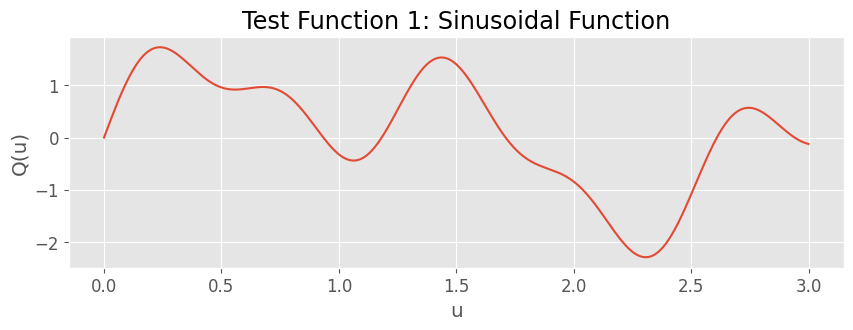

Final result: x* = 2.306306, f(x*) = -2.293866, final gap = 0.000332

Optimal solution: x* = 2.306306, f(x*) = -2.293866


In [51]:
# Define a test function with multiple local maxima
def test_function1(x):
    return np.sin(5 * x) + np.sin(2 * x) + 0.5 * np.sin(10 * x)


# Plot the function
x_values = np.linspace(0, 3, 1000)
f_values = [test_function1(x) for x in x_values]

plt.figure(figsize=(10, 3))
plt.plot(x_values, f_values)
plt.title("Test Function 1: Sinusoidal Function")
plt.xlabel("u")
plt.ylabel("Q(u)")
plt.grid(True)
plt.show()

# Set up parameters and run the algorithm
a, b = 0, 3  # Search interval
L = 15  # Lipschitz constant

# Run the optimization
points, values, m_values, x_opt, fx_opt = shubert_algorithm(
    func=test_function1, a=a, b=b, L=L, max_iterations=50, mode="min", epsilon=1e-3
)

print(f"\nOptimal solution: x* = {x_opt:.6f}, f(x*) = {fx_opt:.6f}")

In [52]:
slideshow1 = create_shubert_slideshow(
    func=test_function1,
    a=a,
    b=b,
    xs=points,
    vals=values,
    m_vals=m_values,
    L=L,
    mode="min",
    interval=1000,  # 1 second between frames
)

slideshow1
